# Informatyka systemów złożonych – laboratorium 1
## Mateusz Kocot

In [1]:
from simulation_map import SimulationMap

from joblib import Parallel, delayed
import imageio
import os
from IPython.display import display, Image

from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

In [2]:
cmap_vals = [1.0, 0.8, 0.6, 0.4, 0.0]
my_colormap = ListedColormap([(x, x, x) for x in cmap_vals])

# Utils

In [3]:
def plot_map(map_, n_turns=None, subplot=None, title=None, cbar=True):
    if subplot:
        plt.subplot(*subplot)
    plt.imshow(map_, cmap=my_colormap, vmax=4)
    if cbar:
        plt.colorbar()
    if title is not None:
        plt.title(title)
    elif n_turns is not None:
        plt.title(f'After {n_turns} turns' if n_turns > 0 else 'Initial state')

# Zadania

## Symulacja dla 10 x 10

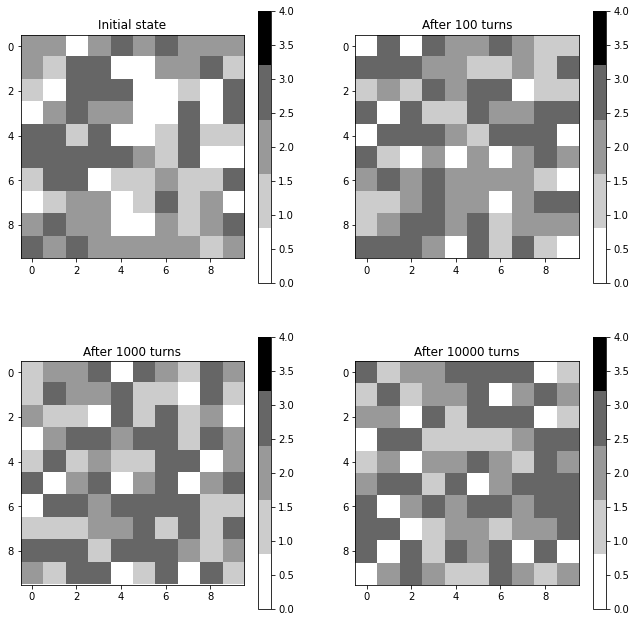

In [4]:
plt.figure(figsize=(11, 11))

sim_map = SimulationMap(10)
plot_map(sim_map.map, 0, (2, 2, 1))

sim_map.simulate_turns(100)
plot_map(sim_map.map, 100, (2, 2, 2))

sim_map.simulate_turns(1000 - 100)
plot_map(sim_map.map, 1000, (2, 2, 3))

sim_map.simulate_turns(10000 - 1000)
plot_map(sim_map.map, 10000, (2, 2, 4))

plt.show()

## Symulacja dla 100 x 100

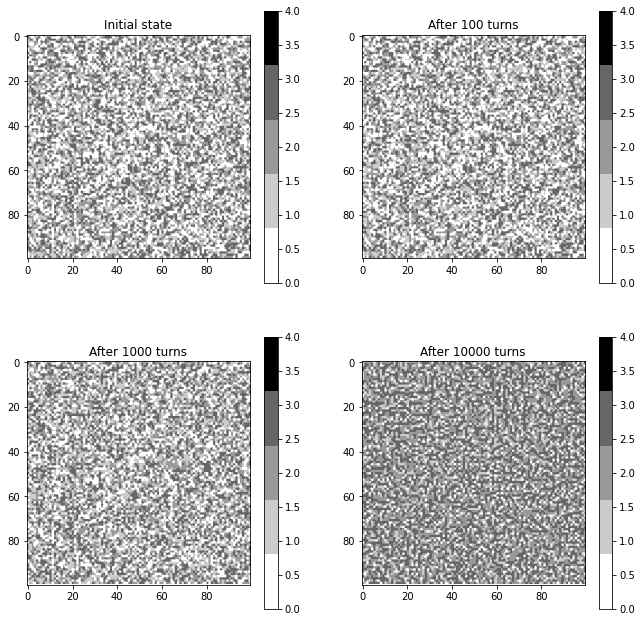

In [5]:
plt.figure(figsize=(11, 11))

sim_map = SimulationMap(100)
plot_map(sim_map.map, 0, (2, 2, 1))

sim_map.simulate_turns(100)
plot_map(sim_map.map, 100, (2, 2, 2))

sim_map.simulate_turns(1000 - 100)
plot_map(sim_map.map, 1000, (2, 2, 3))

sim_map.simulate_turns(10000 - 1000)
plot_map(sim_map.map, 10000, (2, 2, 4))

plt.show()

## Sekwencja symulacji dla rozmiaru 10 x 10

In [6]:
MAP_SIZE = 10
N_TURNS = 500
N_SIMULATIONS = 1000
X_FIT = 30 # max x for fitting

In [7]:
def simulate_sequence(map_size, n_turns, n_simulations, x_fit, extra_params=None, n_jobs=8):
    if extra_params is None:
        extra_params = {}

    # for parallel execution
    def handle_simulation(i): 
        print(f'Simulation {i + 1}...')
        sim_map = SimulationMap(map_size, **extra_params)
        sim_map.simulate_turns(n_turns)
        return sim_map.stats.get_sizes(), sim_map.stats.get_times()

    results = Parallel(n_jobs=n_jobs)(delayed(handle_simulation)(i) for i in range(n_simulations))
    return np.concatenate([r[0] for r in results]), np.concatenate([r[1] for r in results])

In [8]:
avalanche_sizes, avalanche_times = simulate_sequence(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

a=-1.1289; b=4.7143


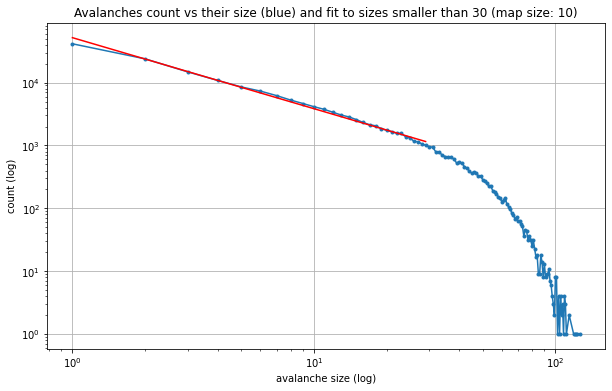

In [9]:
def plot_count_vs_size(map_size, n_turns, n_simulations, x_fit_limit):
    plt.figure(figsize=(10, 6))

    x_plot, y_plot = np.unique(avalanche_sizes, return_counts=True)

    x_fit, y_fit = x_plot[x_plot < x_fit_limit], y_plot[x_plot < x_fit_limit]
    x_fit_log, y_fit_log = np.log10(x_fit), np.log10(y_fit)

    a, b = np.polyfit(x_fit_log, y_fit_log, 1)
    print(f'a={a:0.4f}; b={b:0.4f}')

    plt.loglog(x_plot, y_plot, marker='.')
    plt.plot([10 ** x_fit_log[0], 10 ** x_fit_log[-1]], [10 ** (x_fit_log[0] * a + b), 10 ** (x_fit_log[-1] * a + b)] , c='red')

    plt.title(f'Avalanches count vs their size (blue) and fit to sizes smaller than {x_fit_limit} (map size: {map_size})')
    plt.xlabel('avalanche size (log)')
    plt.ylabel('count (log)')
    plt.grid()

    plt.show()
    
plot_count_vs_size(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

- Obliczając współczynnik odrzucam punkty z prawej strony, gdzie prosta załamuje się. Owe załamanie się jest prawdopodobnie spowodowane wpływem pól brzegowych.
- Współczynnik nachylenia wynosi ok. -1.14.
- Zależność ta (pomijając punkty z prawej strony, tj. dla dużych rozmiarów lawin) jest potęgowa.

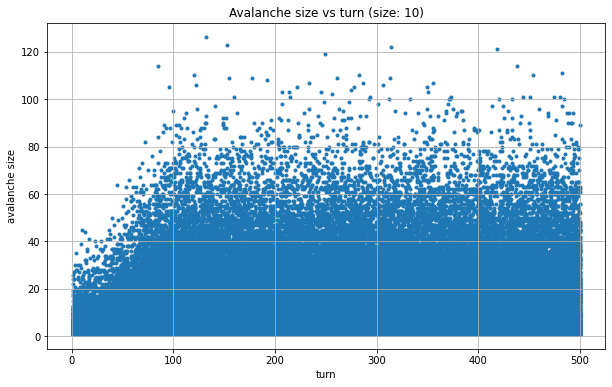

In [10]:
def plot_size_vs_turn(map_size, n_turns, n_simulations, x_fit_limit):
    plt.figure(figsize=(10, 6))

    plt.scatter(avalanche_times, avalanche_sizes, marker='.')

    plt.title(f'Avalanche size vs turn (size: {map_size})')
    plt.xlabel('turn')
    plt.ylabel('avalanche size')
    plt.grid()

    plt.show()
    
plot_size_vs_turn(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

- Stan stacjonarny rozpoczyna się mniej więcej po 100 turach.

## Sekwencja symulacji dla rozmiaru 100 x 100

In [11]:
MAP_SIZE = 100
N_TURNS = 50000
N_SIMULATIONS = 16
X_FIT = 300 # max x for fitting

In [12]:
avalanche_sizes, avalanche_times = simulate_sequence(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

a=-1.2633; b=4.9769


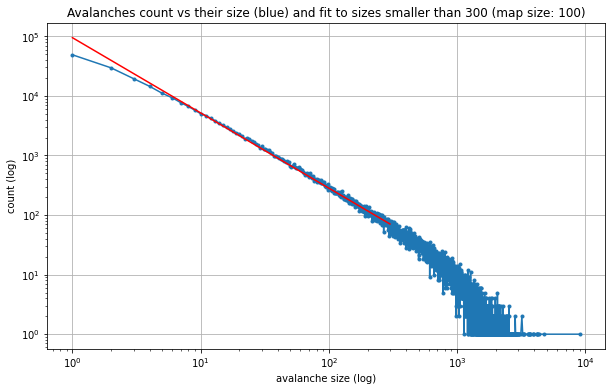

In [13]:
plot_count_vs_size(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

- Po zwiększeniu mapy, a zarazem zmniejszeniem wpływu pól brzegowych (pola brzegowe: O(N), pozostałe pola: O(N^2)), zależność bardziej przypomina prostą.
- Współczynnik wynosi teraz ok. -1.27.

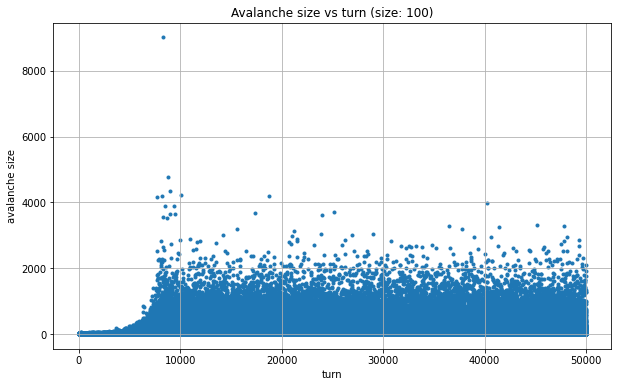

In [14]:
plot_size_vs_turn(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

- Tym razem stan stacjonarny zaczyna się mniej więcej po 10000 turach. Wygląda na to (przynajmniej patrząc na dwa rozpatrzone rozmiary mapy), że liczba tur (czyli też liczba dosypanych ziarenek), po których rozpoczyna się stan stacjonarny jest zależna kwadratowo od rozmiaru mapy (czyli liniowo od liczby pól).

## Zmiana parametrów modelu: maksymalna wysokość stosu: 8, sąsiedztwo Moore’a
- Uwaga 1: zwiększyłem maksymalne wysokości, żeby uniknąć dokładania u sąsiadów większej liczby ziaren niż się zapadła. Dzięki temu zapobiegam nieskończonym lawinom.
- Uwaga 2: zmiana też w inicjalizacji mapy. Tym razem od 0 do 5 (w następnym przypadku: od 0 do 9)

In [15]:
MAP_SIZE = 100
N_TURNS = 100000
N_SIMULATIONS = 16
X_FIT = 300 # max x for fitting

In [16]:
avalanche_sizes, avalanche_times = simulate_sequence(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT, extra_params=
                                                     {'max_height': 8, 'neigh': 'moore'})

a=-1.3981; b=4.9561


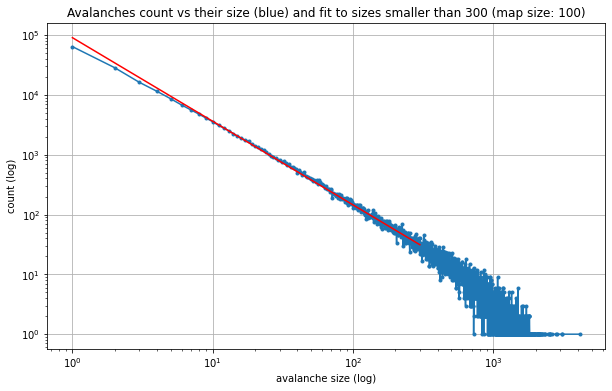

In [17]:
plot_count_vs_size(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

- Współczynnik nachylenia zmienił się nieznacznie do ok. -1.40.

## Zmiana parametrów modelu: maksymalna wysokość stosu: 12, Manhattan distance $r = 2$

In [18]:
MAP_SIZE = 100
N_TURNS = 100000
N_SIMULATIONS = 16
X_FIT = 300 # max x for fitting

In [19]:
avalanche_sizes, avalanche_times = simulate_sequence(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT, extra_params=
                                                     {'max_height': 12, 'neigh': 'manhattan_2'})

a=-1.4047; b=4.7473


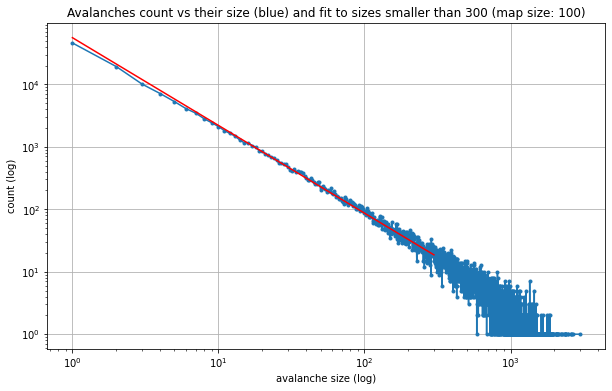

In [20]:
plot_count_vs_size(MAP_SIZE, N_TURNS, N_SIMULATIONS, X_FIT)

- Współczynnik bardzo podobny jak w poprzednim przypadku.

# Gify

In [21]:
def build_gif(map_states, map_size, avalanche_size, show_gif=True):
    gif_path = f'gifs/{map_size}x{map_size}_{avalanche_size}.gif'
    for i, map_state in enumerate(map_states):
        plot_map(map_state, cbar=True, title=f'approx. aval. size: {avalanche_size}; dur.: {i:3}')
        # plt.figure(figsize=(12, 12))
        plt.savefig(f'gifs/{i}.png', dpi=130)
        plt.clf()
        
    with imageio.get_writer(gif_path, mode='I') as writer:
        for i in range(len(map_states)):
            image = imageio.imread(f'gifs/{i}.png')
            writer.append_data(image)
            
    for i in range(len(map_states)):
        os.remove(f'gifs/{i}.png')
        
    if show_gif:
        display(Image(data=open(gif_path, 'rb').read()))
        
def produce_gifs(map_size, expected_avalanche_sizes):
    for expected_avalanche_size in expected_avalanche_sizes:
        sim_map = SimulationMap(map_size)
        while True:
            retval = sim_map.next_turn(process_avalanche=False)
            if retval is not None:
                avalanche, (x, y) = retval
                original_map = np.copy(sim_map.map)
                map_states = avalanche.start(x, y, return_map_states=False)
                
                if expected_avalanche_size * 0.99 < avalanche.size < expected_avalanche_size * 1.01:
                    sim_map.map = original_map
                    avalanche.reset()
                    map_states = avalanche.start(x, y, return_map_states=True)
                    
                    if not expected_avalanche_size * 0.99 < avalanche.size < expected_avalanche_size * 1.01:
                        raise RuntimeError('Wrong Avalanche size!!!')
                    break

        print(f'Avalanche size: {avalanche.size}')
        print(f'Avalanche duration: {avalanche.duration}')    
        build_gif(map_states, map_size, expected_avalanche_size)
        print('------------------------------------------------------------')

### Rozmiar 10 x 10

Avalanche size: 5
Avalanche duration: 5


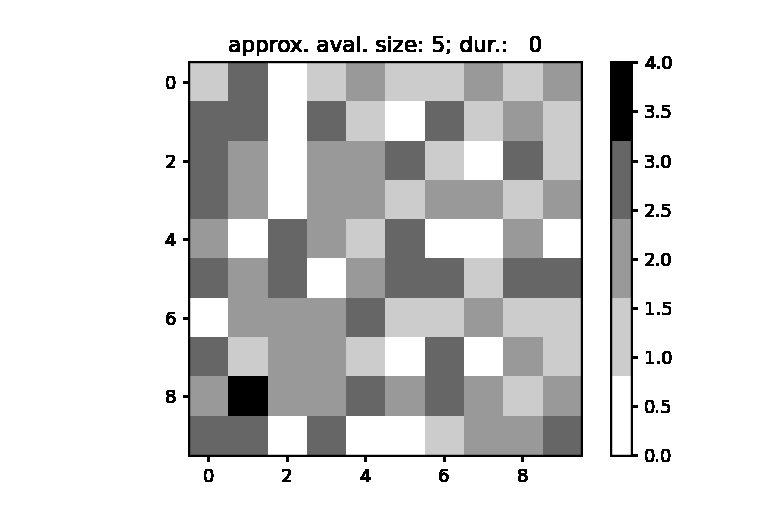

------------------------------------------------------------
Avalanche size: 10
Avalanche duration: 9


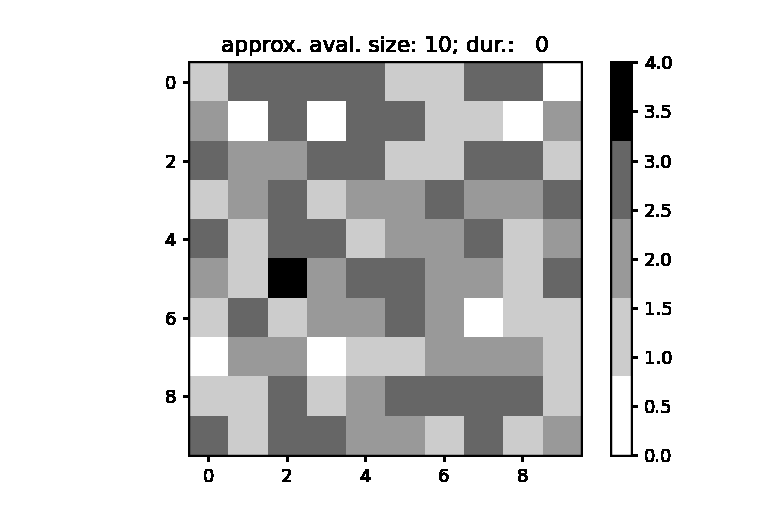

------------------------------------------------------------
Avalanche size: 20
Avalanche duration: 7


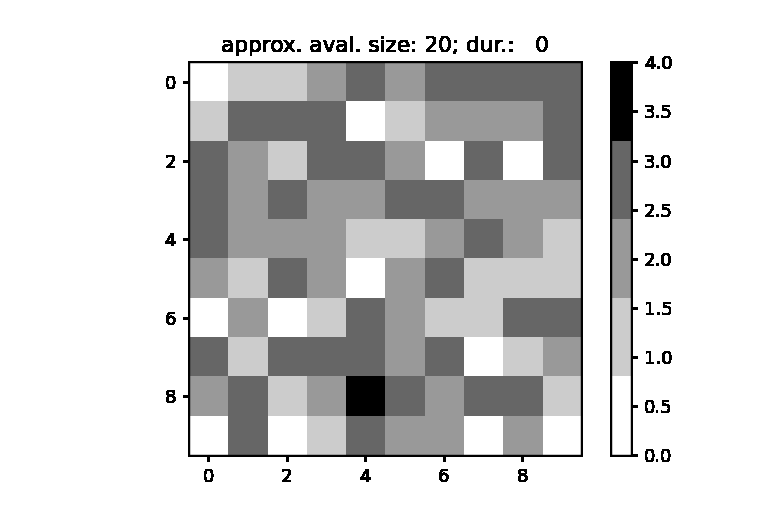

------------------------------------------------------------
Avalanche size: 50
Avalanche duration: 16


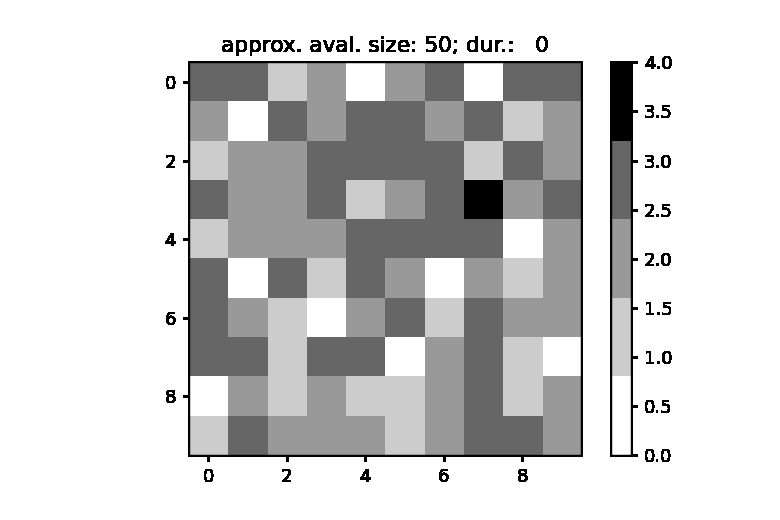

------------------------------------------------------------
Avalanche size: 100
Avalanche duration: 22


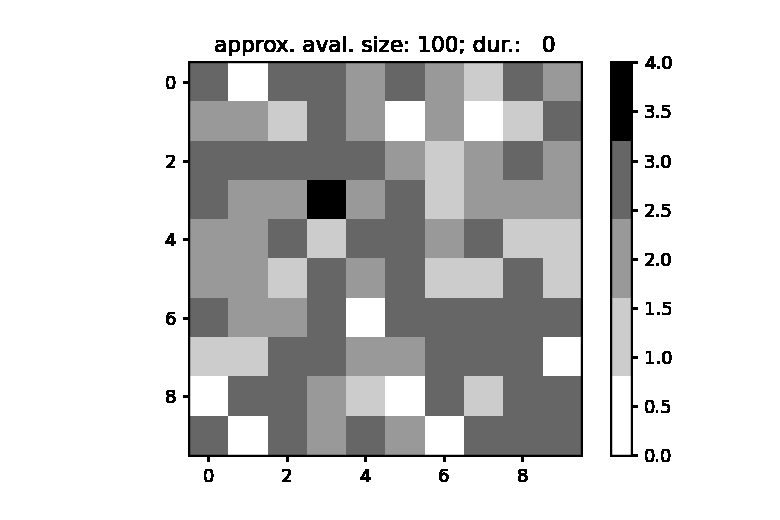

------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

In [22]:
MAP_SIZE = 10
EXPECTED_AVALANCHE_SIZES = [5, 10, 20, 50, 100]

produce_gifs(MAP_SIZE, EXPECTED_AVALANCHE_SIZES)

### Rozmiar 100 x 100

Avalanche size: 50
Avalanche duration: 16


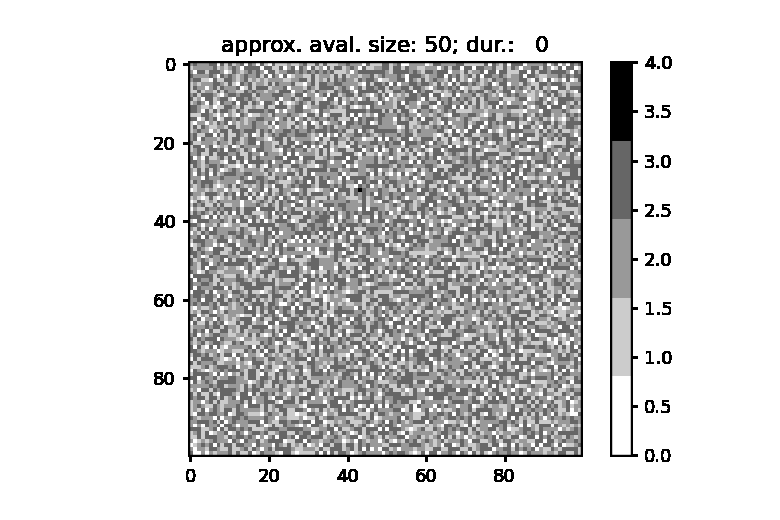

------------------------------------------------------------
Avalanche size: 100
Avalanche duration: 23


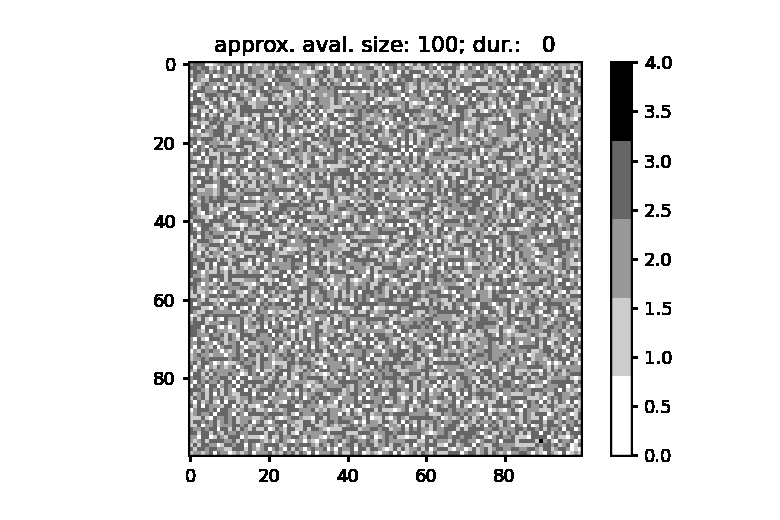

------------------------------------------------------------
Avalanche size: 496
Avalanche duration: 60


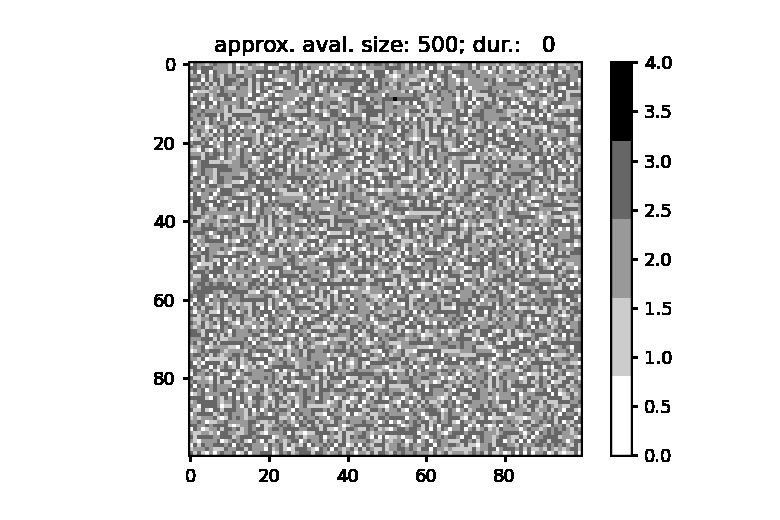

------------------------------------------------------------
Avalanche size: 1009
Avalanche duration: 108


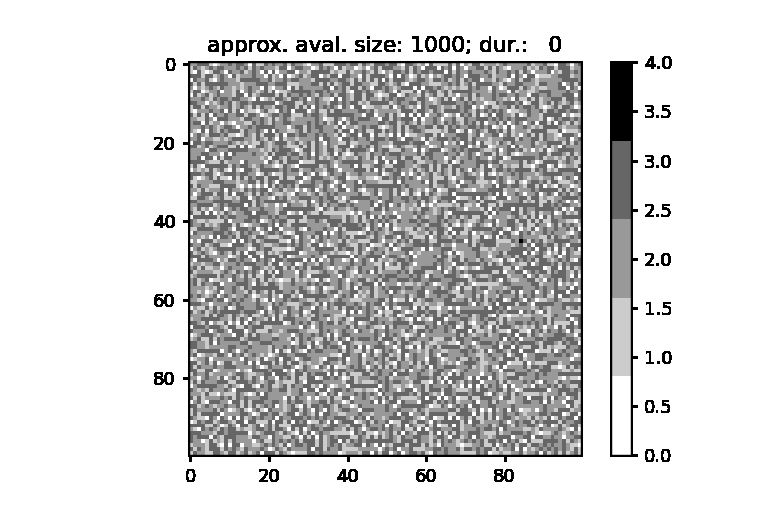

------------------------------------------------------------
Avalanche size: 3022
Avalanche duration: 147


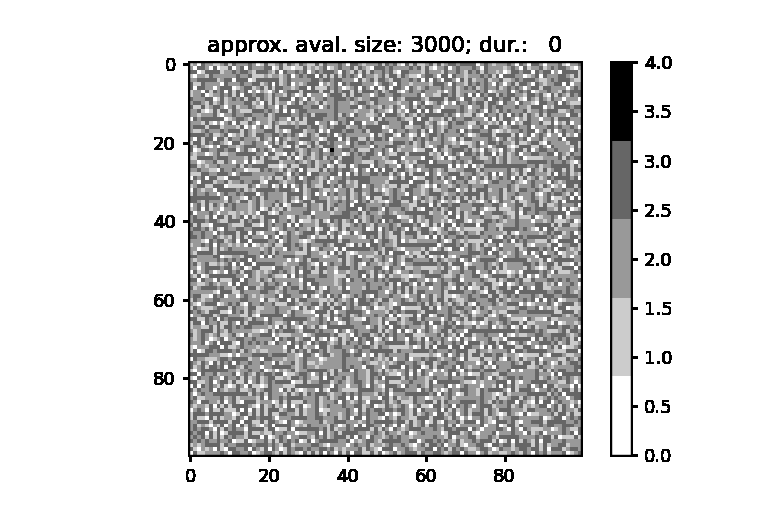

------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

In [23]:
MAP_SIZE = 100
EXPECTED_AVALANCHE_SIZES = [50, 100, 500, 1000, 3000]

produce_gifs(MAP_SIZE, EXPECTED_AVALANCHE_SIZES)